###Creating clusters on global development measurement dataset

##EDA
Data cleaning:

1) Read the data.


2) Checking the basic info about the data.


3) Dropping unwanted columns.


4) Checking for duplicates.


5) Proper datatype conversion.


6) Renaming columns.


7) Handling null values.


8) Correlation analysis.


9) Outlier detection.


10) Data transformation

In [2]:

import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering,KMeans,DBSCAN
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.impute import KNNImputer
import warnings
warnings.filterwarnings("ignore")






In [3]:
world=pd.read_excel("World_development_mesurement.xlsx")

In [4]:
world.head()

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,"$54,790,058,957",0.035,$60,...,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,"$102,000,000","$193,000,000"
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,"$9,129,594,819",0.034,$22,...,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,"$34,000,000","$146,000,000"
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,"$2,359,122,303",0.043,$15,...,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,"$77,000,000","$50,000,000"
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,"$5,788,311,645",0.047,$152,...,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,"$227,000,000","$209,000,000"
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,"$2,610,959,139",0.051,$12,...,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,"$23,000,000","$30,000,000"


In [5]:
world.tail()

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
2699,NaN,NaN,NaN,Turks and Caicos Islands,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1,NaN,NaN,NaN,32427,0.911,NaN,NaN
2700,0.013,46.4%,NaN,United States,5.0,4.0,2132446.0,"$16,244,600,000,000",0.179,"$8,895",...,76.0,1.0,1,0.196,0.667,0.136,313873685,0.811,"$200,092,000,000","$126,573,000,000"
2701,0.015,41.9%,NaN,Uruguay,7.0,85.0,NaN,"$50,004,354,667",0.089,"$1,308",...,74.0,1.5,1,0.220,0.639,0.140,3395253,0.948,"$2,222,000,000","$1,028,000,000"
2702,0.020,61.9%,NaN,"Venezuela, RB",144.0,180.0,NaN,"$381,286,223,859",0.046,$593,...,72.0,1.0,1,0.288,0.652,0.060,29954782,0.889,"$904,000,000","$3,202,000,000"
2703,0.011,NaN,NaN,Virgin Islands (U.S.),NaN,NaN,NaN,NaN,NaN,NaN,...,76.0,NaN,1,0.206,0.641,0.152,105275,0.949,NaN,NaN


## EDA

In [6]:
world.shape  ## checking the shape of dataset


(2704, 25)

In [7]:
world.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth Rate              2585 non-null   float64
 1   Business Tax Rate       1423 non-null   object 
 2   CO2 Emissions           2125 non-null   float64
 3   Country                 2704 non-null   object 
 4   Days to Start Business  1718 non-null   float64
 5   Ease of Business        185 non-null    float64
 6   Energy Usage            1785 non-null   float64
 7   GDP                     2494 non-null   object 
 8   Health Exp % GDP        2395 non-null   float64
 9   Health Exp/Capita       2395 non-null   object 
 10  Hours to do Tax         1416 non-null   float64
 11  Infant Mortality Rate   2444 non-null   float64
 12  Internet Usage          2531 non-null   float64
 13  Lending Interest        1880 non-null   float64
 14  Life Expectancy Female  2568 non-null   

In [8]:
world.describe().T  ##descriptive statistics of the numerical columns

,count,mean,std,min,25%,50%,75%,max
Birth Rate,2585.0,2.271489e-02,1.133843e-02,0.007,0.01300,2.000000e-02,3.100000e-02,5.300000e-02
CO2 Emissions,2125.0,1.423071e+05,6.159288e+05,7.000,1360.00000,8.529000e+03,5.910800e+04,8.286892e+06
Days to Start Business,1718.0,3.999942e+01,5.731859e+01,1.000,13.00000,2.600000e+01,4.500000e+01,6.940000e+02
Ease of Business,185.0,9.487568e+01,5.479191e+01,1.000,48.00000,9.400000e+01,1.420000e+02,1.890000e+02
Energy Usage,1785.0,7.723684e+04,2.599239e+05,8.000,3737.00000,1.433800e+04,4.185200e+04,2.727728e+06
Health Exp % GDP,2395.0,6.416952e-02,2.632460e-02,0.008,0.04600,6.100000e-02,7.900000e-02,2.250000e-01
Hours to do Tax,1416.0,3.020685e+02,2.732997e+02,12.000,156.00000,2.390000e+02,3.447500e+02,2.600000e+03
Infant Mortality Rate,2444.0,3.281301e-02,2.996760e-02,0.002,0.00900,2.000000e-02,5.300000e-02,1.410000e-01
Internet Usage,2531.0,2.397471e-01,2.601318e-01,0.000,0.00000,1.000000e-01,4.000000e-01,1.000000e+00
Lending Interest,1880.0,1.481027e-01,1.718291e-01,0.005,0.08000,1.200000e-01,1.730000e-01,4.965000e+00


In [9]:
country1=list(world['Country'].unique())   ## the list of unique countries
country1

['Algeria',
 'Angola',
 'Benin',
 'Botswana',
 'Burkina Faso',
 'Burundi',
 'Cameroon',
 'Central African Republic',
 'Chad',
 'Comoros',
 'Congo, Dem. Rep.',
 'Congo, Rep.',
 "Cote d'Ivoire",
 'Djibouti',
 'Egypt, Arab Rep.',
 'Equatorial Guinea',
 'Eritrea',
 'Ethiopia',
 'Gabon',
 'Gambia, The',
 'Ghana',
 'Guinea',
 'Guinea-Bissau',
 'Kenya',
 'Lesotho',
 'Liberia',
 'Libya',
 'Madagascar',
 'Malawi',
 'Mali',
 'Mauritania',
 'Mauritius',
 'Morocco',
 'Mozambique',
 'Namibia',
 'Niger',
 'Nigeria',
 'Rwanda',
 'Sao Tome and Principe',
 'Senegal',
 'Seychelles',
 'Sierra Leone',
 'Somalia',
 'South Africa',
 'South Sudan',
 'Sudan',
 'Swaziland',
 'Tanzania',
 'Togo',
 'Tunisia',
 'Uganda',
 'Zambia',
 'Zimbabwe',
 'Afghanistan',
 'Armenia',
 'Azerbaijan',
 'Bangladesh',
 'Bhutan',
 'Brunei Darussalam',
 'Cambodia',
 'China',
 'Georgia',
 'Hong Kong SAR, China',
 'India',
 'Indonesia',
 'Japan',
 'Kazakhstan',
 'Korea, Dem. Rep.',
 'Korea, Rep.',
 'Kyrgyz Republic',
 'Lao PDR',
 'Ma

In [10]:
##number of unique contries
world['Country'].nunique()

208

In [11]:
world['Country'].value_counts()

Algeria                  13
Angola                   13
Turkey                   13
Ukraine                  13
United Kingdom           13
                         ..
Malaysia                 13
Maldives                 13
Mongolia                 13
Myanmar                  13
Virgin Islands (U.S.)    13
Name: Country, Length: 208, dtype: int64

##so there are totally 208 countries each country occuring 13 times in the data set

In [12]:
world['Number of Records'].value_counts()

1    2704
Name: Number of Records, dtype: int64

##every value in the column number of records is 1 hence  it does not give any kind of information so we can drop the column

In [13]:
world.drop('Number of Records',axis=1,inplace=True)

#### data cleaning ( removing special characters )

In [14]:


world["Tourism Inbound"]=world["Tourism Inbound"].str.replace("$","")
world["Tourism Outbound"]=world["Tourism Outbound"].str.replace("$","")
world["Health Exp/Capita"]=world["Health Exp/Capita"].str.replace("$","")
world["GDP"]=world["GDP"].str.replace("$","")
world["Business Tax Rate"]=world["Business Tax Rate"].str.replace("%","")
world.head()

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,"54,790,058,957",0.035,60,...,71.0,67.0,0.0,0.342,0.619,0.039,31719449,0.599,"102,000,000","193,000,000"
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,"9,129,594,819",0.034,22,...,47.0,44.0,0.0,0.476,0.499,0.025,13924930,0.324,"34,000,000","146,000,000"
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,"2,359,122,303",0.043,15,...,57.0,53.0,0.0,0.454,0.517,0.029,6949366,0.383,"77,000,000","50,000,000"
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,"5,788,311,645",0.047,152,...,52.0,49.0,0.1,0.383,0.587,0.029,1755375,0.532,"227,000,000","209,000,000"
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,"2,610,959,139",0.051,12,...,52.0,49.0,0.0,0.468,0.505,0.028,11607944,0.178,"23,000,000","30,000,000"


In [15]:
world["Tourism Inbound"]=world["Tourism Inbound"].str.replace(",","")
world["Tourism Outbound"]=world["Tourism Outbound"].str.replace(",","")
world["Health Exp/Capita"]=world["Health Exp/Capita"].str.replace(",","")
world["GDP"]=world["GDP"].str.replace(",","")
world.head()

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,54790058957,0.035,60,...,71.0,67.0,0.0,0.342,0.619,0.039,31719449,0.599,102000000,193000000
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,9129594819,0.034,22,...,47.0,44.0,0.0,0.476,0.499,0.025,13924930,0.324,34000000,146000000
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,2359122303,0.043,15,...,57.0,53.0,0.0,0.454,0.517,0.029,6949366,0.383,77000000,50000000
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,5788311645,0.047,152,...,52.0,49.0,0.1,0.383,0.587,0.029,1755375,0.532,227000000,209000000
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,2610959139,0.051,12,...,52.0,49.0,0.0,0.468,0.505,0.028,11607944,0.178,23000000,30000000


###changing the data types for required culumns

In [16]:
#In clustering we deal with the numeric values and converting categorical values into numerical
#converting object type datatypes to floattypes
world['Tourism Inbound']=pd.to_numeric(world['Tourism Inbound'])
world['Tourism Outbound']=pd.to_numeric(world['Tourism Outbound'])
world['Health Exp/Capita']=pd.to_numeric(world['Health Exp/Capita'])
world['GDP']=pd.to_numeric(world['GDP'])
world['Business Tax Rate']=pd.to_numeric(world['Business Tax Rate'])


In [17]:
world.dtypes

Birth Rate                float64
Business Tax Rate         float64
CO2 Emissions             float64
Country                    object
Days to Start Business    float64
Ease of Business          float64
Energy Usage              float64
GDP                       float64
Health Exp % GDP          float64
Health Exp/Capita         float64
Hours to do Tax           float64
Infant Mortality Rate     float64
Internet Usage            float64
Lending Interest          float64
Life Expectancy Female    float64
Life Expectancy Male      float64
Mobile Phone Usage        float64
Population 0-14           float64
Population 15-64          float64
Population 65+            float64
Population Total            int64
Population Urban          float64
Tourism Inbound           float64
Tourism Outbound          float64
dtype: object

In [18]:
world.describe().T

,count,mean,std,min,25%,50%,75%,max
Birth Rate,2585.0,2.271489e-02,1.133843e-02,7.000000e-03,1.300000e-02,2.000000e-02,3.100000e-02,5.300000e-02
Business Tax Rate,1423.0,4.896690e+01,4.095412e+01,8.200000e+00,3.240000e+01,4.100000e+01,5.155000e+01,3.391000e+02
CO2 Emissions,2125.0,1.423071e+05,6.159288e+05,7.000000e+00,1.360000e+03,8.529000e+03,5.910800e+04,8.286892e+06
Days to Start Business,1718.0,3.999942e+01,5.731859e+01,1.000000e+00,1.300000e+01,2.600000e+01,4.500000e+01,6.940000e+02
Ease of Business,185.0,9.487568e+01,5.479191e+01,1.000000e+00,4.800000e+01,9.400000e+01,1.420000e+02,1.890000e+02
Energy Usage,1785.0,7.723684e+04,2.599239e+05,8.000000e+00,3.737000e+03,1.433800e+04,4.185200e+04,2.727728e+06
GDP,2494.0,2.638540e+11,1.129910e+12,6.310127e+07,3.539042e+09,1.507975e+10,1.102047e+11,1.624460e+13
Health Exp % GDP,2395.0,6.416952e-02,2.632460e-02,8.000000e-03,4.600000e-02,6.100000e-02,7.900000e-02,2.250000e-01
Health Exp/Capita,2395.0,8.013971e+02,1.473448e+03,2.000000e+00,5.000000e+01,1.930000e+02,6.650000e+02,9.908000e+03
Hours to do Tax,1416.0,3.020685e+02,2.732997e+02,1.200000e+01,1.560000e+02,2.390000e+02,3.447500e+02,2.600000e+03


####checking and imputing null values


In [19]:
#check for null values
dfnull=pd.DataFrame(world.isnull().sum())
dfnull.rename(columns={0:"nullvalues"},inplace=True)
dfnull["percentage"]=np.round(dfnull["nullvalues"]/world.shape[0],2)
dfnull

,nullvalues,percentage
Birth Rate,119,0.04
Business Tax Rate,1281,0.47
CO2 Emissions,579,0.21
Country,0,0.00
Days to Start Business,986,0.36
Ease of Business,2519,0.93
Energy Usage,919,0.34
GDP,210,0.08
Health Exp % GDP,309,0.11
Health Exp/Capita,309,0.11


<Axes: >

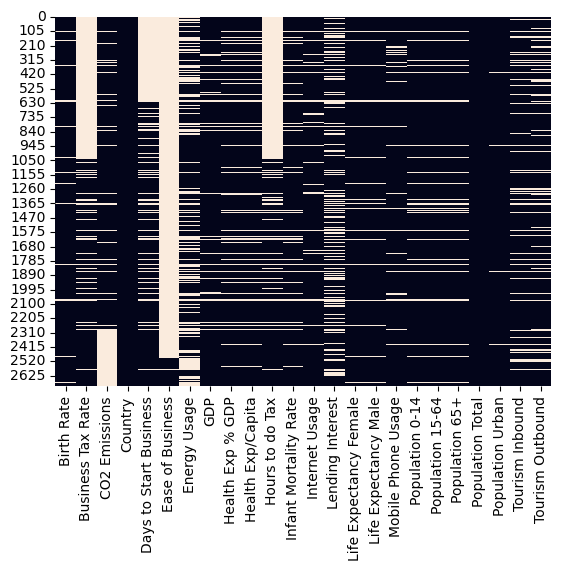

In [20]:
sns.heatmap(world.isnull(),cbar=False)

##using heat map we can visualize the null values
##Black color indicates non null values
##white color indicates null values
##country column  contains no null values where as ease of bussines has maximum null values

##ease of business contains more null values so we are droping the column

In [21]:
world.drop("Ease of Business",axis=1,inplace=True)

In [22]:
colnull=world.drop(["Country","Population Total"],axis=1).columns
colnull

Index(['Birth Rate', 'Business Tax Rate', 'CO2 Emissions',
       'Days to Start Business', 'Energy Usage', 'GDP', 'Health Exp % GDP',
       'Health Exp/Capita', 'Hours to do Tax', 'Infant Mortality Rate',
       'Internet Usage', 'Lending Interest', 'Life Expectancy Female',
       'Life Expectancy Male', 'Mobile Phone Usage', 'Population 0-14',
       'Population 15-64', 'Population 65+', 'Population Urban',
       'Tourism Inbound', 'Tourism Outbound'],
      dtype='object')

In [23]:
for i in colnull:
  print (i)
  print(world[world[i].isnull()==True].Country.value_counts())
  print("...........")
  print()

Birth Rate
Monaco                       13
Turks and Caicos Islands     13
Sint Maarten (Dutch part)    12
American Samoa               11
St. Kitts and Nevis          11
Faeroe Islands               10
Isle of Man                  10
Marshall Islands             10
Dominica                     10
Cayman Islands                8
Curacao                       6
San Marino                    4
Andorra                       1
Name: Country, dtype: int64
...........

Business Tax Rate
Virgin Islands (U.S.)    13
Greenland                13
Korea, Dem. Rep.         13
French Polynesia         13
Guam                     13
                         ..
Mongolia                  5
Nepal                     5
Pakistan                  5
Philippines               5
Hungary                   5
Name: Country, Length: 208, dtype: int64
...........

CO2 Emissions
Puerto Rico                  13
Sint Maarten (Dutch part)    13
South Sudan                  13
Isle of Man                  13
Kosovo    

In [24]:
world.shape

(2704, 23)

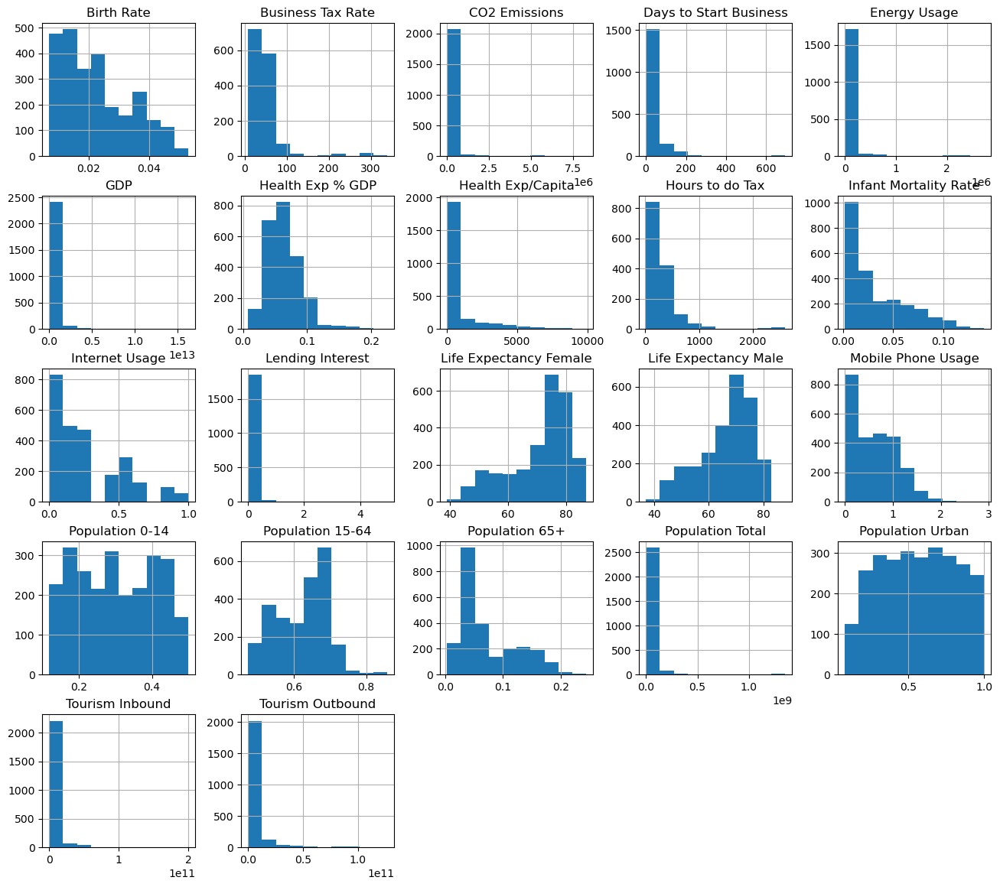

In [25]:
##check for distribution of data
plt.rcParams["figure.figsize"]=(16,14)
world.drop(["Country"],axis=1).hist()
plt.show()

In [26]:
imputer=KNNImputer(n_neighbors=3)
after=imputer.fit_transform(world.drop(["Country","Population Total"],axis=1))
after

array([[2.00000000e-02, 4.48666667e+01, 8.79310000e+04, ...,
        5.99000000e-01, 1.02000000e+08, 1.93000000e+08],
       [5.00000000e-02, 4.48666667e+01, 9.54200000e+03, ...,
        3.24000000e-01, 3.40000000e+07, 1.46000000e+08],
       [4.30000000e-02, 4.48666667e+01, 1.61700000e+03, ...,
        3.83000000e-01, 7.70000000e+07, 5.00000000e+07],
       ...,
       [1.50000000e-02, 4.19000000e+01, 6.73333333e+02, ...,
        9.48000000e-01, 2.22200000e+09, 1.02800000e+09],
       [2.00000000e-02, 6.19000000e+01, 6.00000000e+02, ...,
        8.89000000e-01, 9.04000000e+08, 3.20200000e+09],
       [1.10000000e-02, 4.87000000e+01, 3.36350000e+04, ...,
        9.49000000e-01, 8.93333333e+07, 1.93333333e+08]])

In [27]:
world1=pd.DataFrame(data=after,columns=colnull)
world1["Population Total"]=world["Population Total"]
world1["Country"]=world["Country"]
world1

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,...,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Urban,Tourism Inbound,Tourism Outbound,Population Total,Country
0,0.020000,44.866667,87931.000000,41.666667,2.699800e+04,5.479006e+10,0.035000,60.000000,181.000000,0.034,...,67.000000,0.0,0.342,0.619,0.039,0.599,1.020000e+08,1.930000e+08,31719449,Algeria
1,0.050000,44.866667,9542.000000,41.666667,7.499000e+03,9.129595e+09,0.034000,22.000000,181.000000,0.128,...,44.000000,0.0,0.476,0.499,0.025,0.324,3.400000e+07,1.460000e+08,13924930,Angola
2,0.043000,44.866667,1617.000000,41.666667,1.983000e+03,2.359122e+09,0.043000,15.000000,181.000000,0.090,...,53.000000,0.0,0.454,0.517,0.029,0.383,7.700000e+07,5.000000e+07,6949366,Benin
3,0.027000,44.866667,4276.000000,41.666667,1.836000e+03,5.788312e+09,0.047000,152.000000,181.000000,0.054,...,49.000000,0.1,0.383,0.587,0.029,0.532,2.270000e+08,2.090000e+08,1755375,Botswana
4,0.046000,44.033333,1041.000000,32.666667,1.927233e+04,2.610959e+09,0.051000,12.000000,275.666667,0.096,...,49.000000,0.0,0.468,0.505,0.028,0.178,2.300000e+07,3.000000e+07,11607944,Burkina Faso
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.037667,68.233333,33030.000000,58.666667,1.216000e+04,2.209293e+10,0.037333,32.333333,331.000000,0.084,...,54.666667,0.0,0.424,0.545,0.031,0.911,7.100000e+07,1.296667e+08,32427,Turks and Caicos Islands
2700,0.013000,46.400000,602.666667,5.000000,2.132446e+06,1.624460e+13,0.179000,8895.000000,175.000000,0.006,...,76.000000,1.0,0.196,0.667,0.136,0.811,2.000920e+11,1.265730e+11,313873685,United States
2701,0.015000,41.900000,673.333333,7.000000,2.005067e+04,5.000435e+10,0.089000,1308.000000,310.000000,0.010,...,74.000000,1.5,0.220,0.639,0.140,0.948,2.222000e+09,1.028000e+09,3395253,Uruguay
2702,0.020000,61.900000,600.000000,144.000000,1.998733e+04,3.812862e+11,0.046000,593.000000,792.000000,0.013,...,72.000000,1.0,0.288,0.652,0.060,0.889,9.040000e+08,3.202000e+09,29954782,"Venezuela, RB"


In [28]:
#check for null values
world1.isnull().sum()

Birth Rate                0
Business Tax Rate         0
CO2 Emissions             0
Days to Start Business    0
Energy Usage              0
GDP                       0
Health Exp % GDP          0
Health Exp/Capita         0
Hours to do Tax           0
Infant Mortality Rate     0
Internet Usage            0
Lending Interest          0
Life Expectancy Female    0
Life Expectancy Male      0
Mobile Phone Usage        0
Population 0-14           0
Population 15-64          0
Population 65+            0
Population Urban          0
Tourism Inbound           0
Tourism Outbound          0
Population Total          0
Country                   0
dtype: int64

##after imputing the null values using  KNN Imputer no null values found in the data

In [29]:
##checking for duplicate values
world1[world1.duplicated()]

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,...,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Urban,Tourism Inbound,Tourism Outbound,Population Total,Country


## CORRELATION

In [30]:
world1.corr()

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,...,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Urban,Tourism Inbound,Tourism Outbound,Population Total
Birth Rate,1.000000,0.212896,-0.157734,0.128505,-0.165478,-0.190914,-0.186525,-0.419895,0.079120,0.707247,...,-0.861684,-0.822018,-0.528905,0.915275,-0.877484,-0.743423,-0.517079,-0.278814,-0.285722,-0.066151
Business Tax Rate,0.212896,1.000000,0.019526,0.033235,0.020048,0.006738,0.018396,-0.103798,0.169249,0.224119,...,-0.212216,-0.230923,-0.145525,0.163320,-0.192186,-0.081920,-0.062843,-0.013668,-0.018059,0.045433
CO2 Emissions,-0.157734,0.019526,1.000000,-0.033228,0.908826,0.690341,0.147924,0.190789,0.042507,-0.125393,...,0.117940,0.122986,0.029962,-0.173292,0.167458,0.139028,0.081690,0.588562,0.560744,0.650256
Days to Start Business,0.128505,0.033235,-0.033228,1.000000,-0.046698,-0.071852,-0.128760,-0.173621,0.161163,0.160350,...,-0.147733,-0.158440,-0.151665,0.155409,-0.128232,-0.155829,-0.025691,-0.113805,-0.110533,-0.001381
Energy Usage,-0.165478,0.020048,0.908826,-0.046698,1.000000,0.850475,0.209261,0.262102,0.047645,-0.135814,...,0.130278,0.135800,0.056937,-0.189755,0.170387,0.170591,0.097518,0.736282,0.695614,0.650468
GDP,-0.190914,0.006738,0.690341,-0.071852,0.850475,1.000000,0.332154,0.417618,0.021868,-0.176929,...,0.192738,0.203320,0.135566,-0.231685,0.161064,0.275414,0.166666,0.880534,0.857801,0.381057
Health Exp % GDP,-0.186525,0.018396,0.147924,-0.128760,0.209261,0.332154,1.000000,0.416642,-0.070929,-0.220216,...,0.163787,0.173931,0.169869,-0.255780,0.084247,0.438135,0.146831,0.371357,0.358101,-0.035556
Health Exp/Capita,-0.419895,-0.103798,0.190789,-0.173621,0.262102,0.417618,0.416642,1.000000,-0.183791,-0.354872,...,0.432369,0.467900,0.440010,-0.473409,0.333797,0.556467,0.459807,0.501924,0.521193,-0.013971
Hours to do Tax,0.079120,0.169249,0.042507,0.161163,0.047645,0.021868,-0.070929,-0.183791,1.000000,0.111203,...,-0.093771,-0.120865,0.002494,0.064078,-0.070351,-0.039562,0.029167,-0.056222,-0.036140,0.096583
Infant Mortality Rate,0.707247,0.224119,-0.125393,0.160350,-0.135814,-0.176929,-0.220216,-0.354872,0.111203,1.000000,...,-0.751685,-0.732500,-0.493600,0.703446,-0.677913,-0.566277,-0.387533,-0.230118,-0.250871,-0.017690


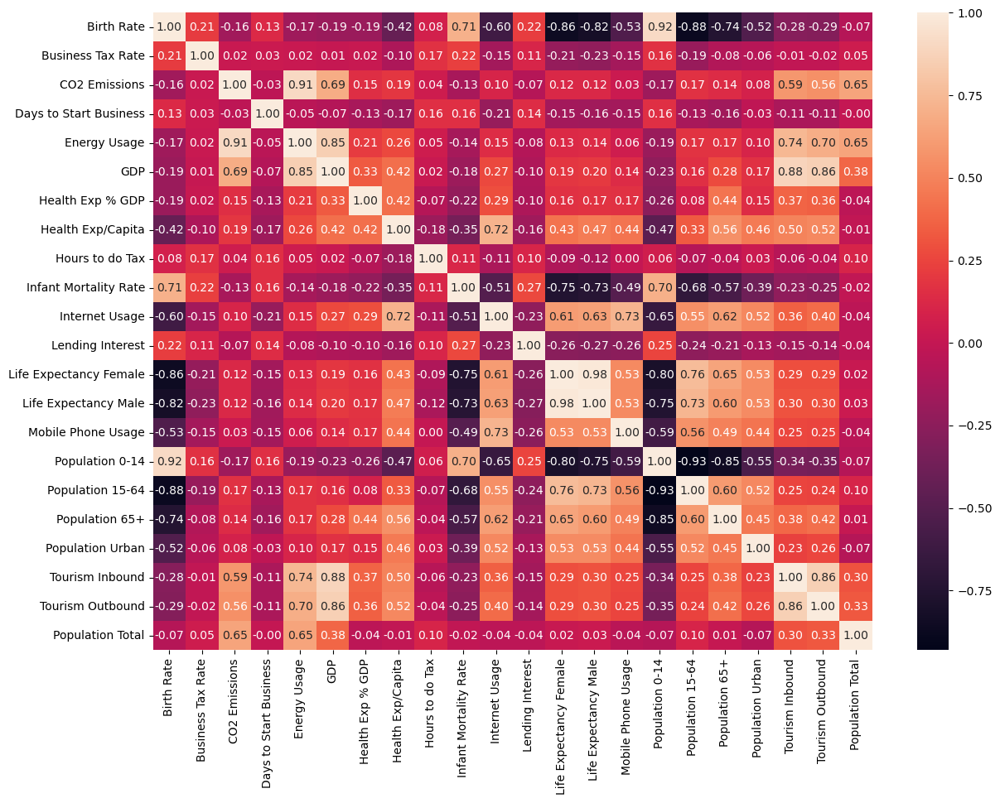

In [31]:
plt.figure(figsize=(14,10))
sns.heatmap(world1.corr(),annot=True,fmt=".2f")
plt.show()

##correlation matrix it gives the magnitude of co relation betweeen the features, positive sign  shows the direct  correlation ,negative sign shows the indirect or inverse correlation


##birth rate
#it is highly positively corelated with population 0-14  and infant mortality rate
#negatively corelated with life expefctancy of male and life expefctancy of female and population 15-64


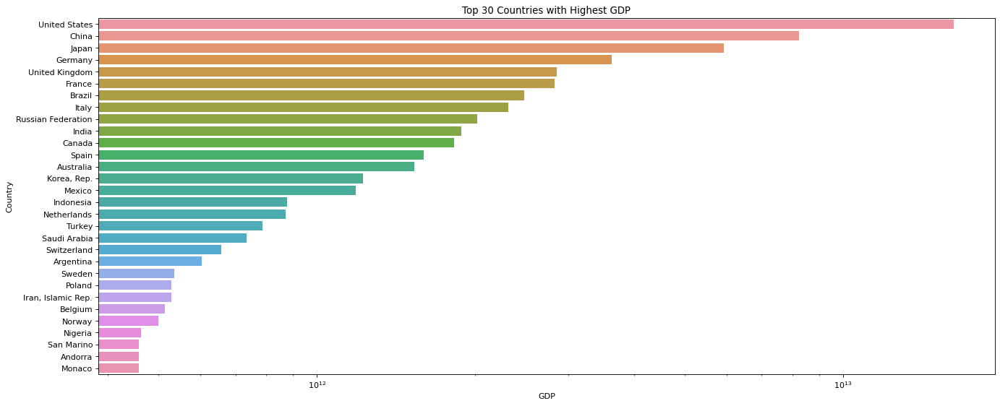

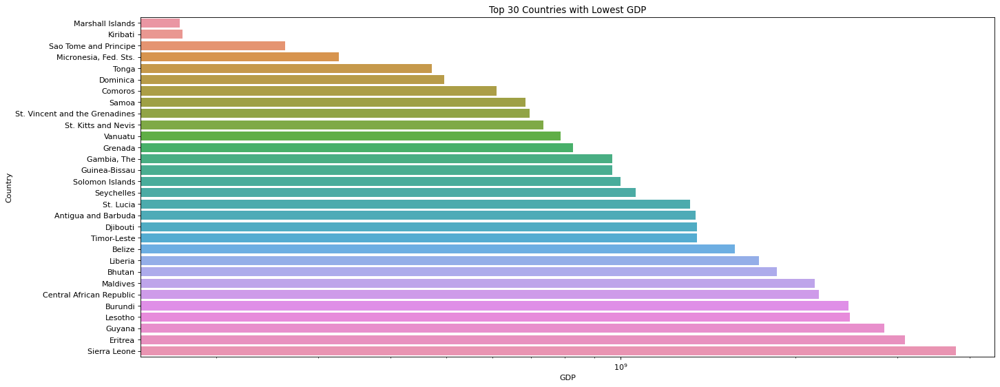

In [32]:
gds_gdp_country = world1.groupby('Country', group_keys = False).apply(lambda x: x.loc[x['GDP'].idxmax()])

top30 = gds_gdp_country['GDP'].sort_values(ascending=False)[:30]
bot30 = gds_gdp_country['GDP'].sort_values()[:30]

plt.figure(figsize = (20,8), dpi = 80)
top_gdp = sns.barplot(x = top30, y = top30.index, log = True)
plt.title('Top 30 Countries with Highest GDP')
plt.show()

plt.figure(figsize = (20,8), dpi = 80)
bot_gdp = sns.barplot(x = bot30, y = bot30.index, log = True)
plt.title('Top 30 Countries with Lowest GDP')
plt.show()

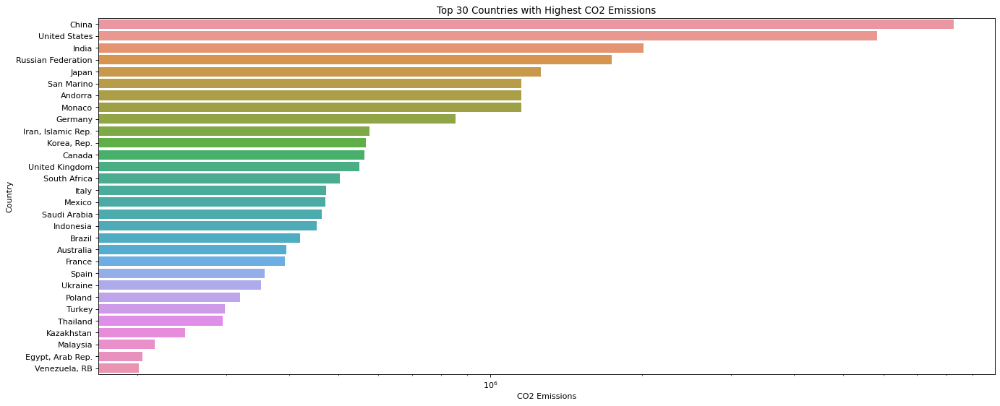

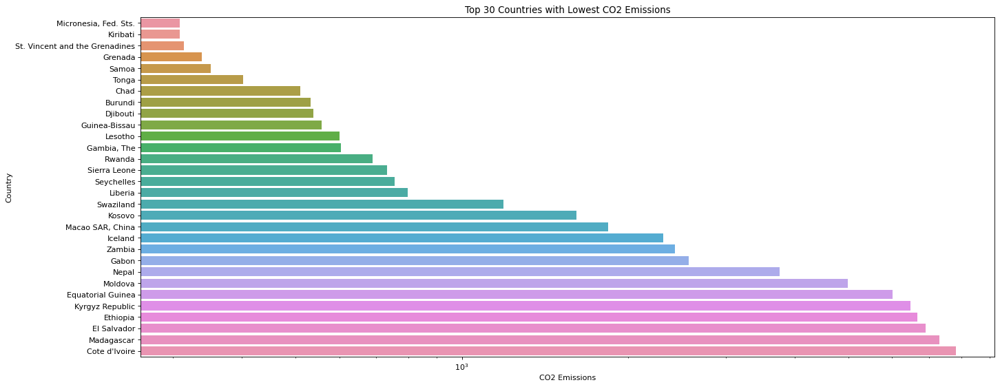

In [34]:
# Top 30 Countries with highest and lowest CO2 Emissions

gds_ce_country = world1.groupby('Country', group_keys = False).apply(lambda x: x.loc[x['CO2 Emissions'].idxmax()])

top34 = gds_ce_country['CO2 Emissions'].sort_values(ascending=False)[:30]
bot34 = gds_ce_country['CO2 Emissions'].sort_values()[:30]

plt.figure(figsize = (20,8), dpi = 80)
top_ce = sns.barplot(x = top34, y = top34.index, log = True)
plt.title('Top 30 Countries with Highest CO2 Emissions')
plt.show()

plt.figure(figsize=(20,8), dpi=80)
bot_ce = sns.barplot(x = bot34, y = bot34.index, log = True)
plt.title('Top 30 Countries with Lowest CO2 Emissions')
plt.show()

## UNIVARIATE PLOTS

<Figure size 1000x1200 with 0 Axes>

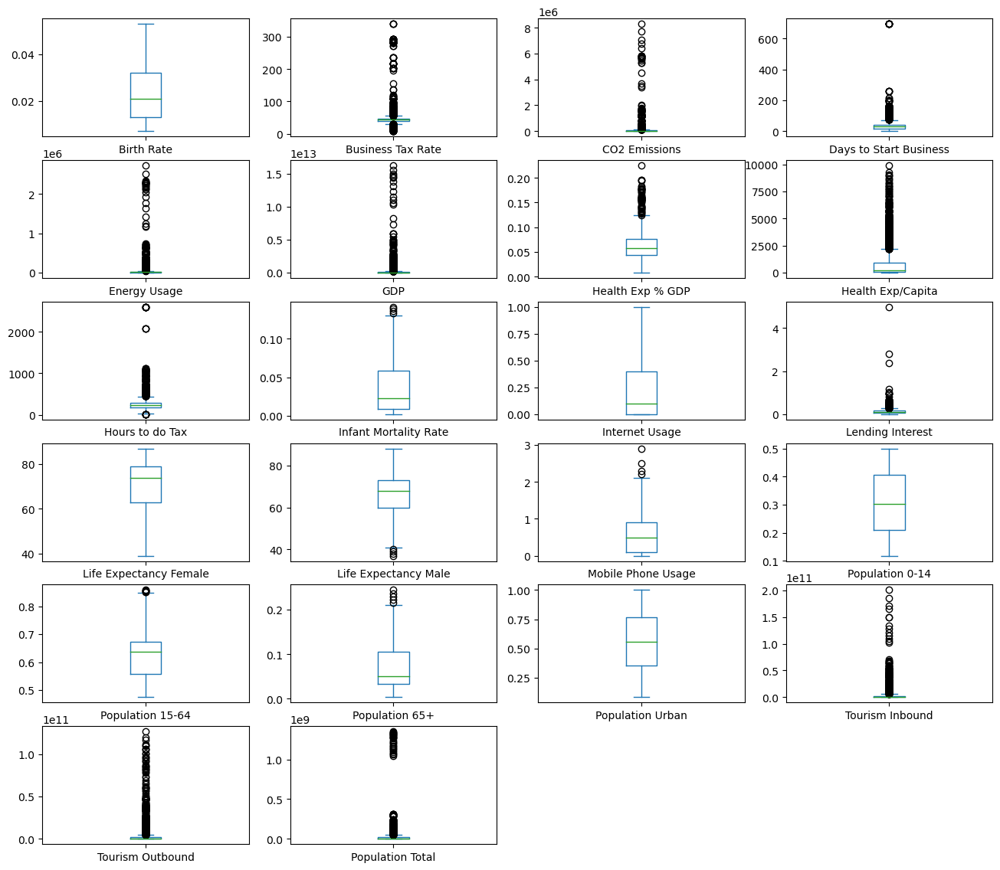

In [32]:
##check for outliers
plt.figure(figsize=(10,12))
world1.drop(["Country"],axis=1).plot(kind="box",subplots=True,layout=(6,4))
plt.show()

##box plot is mainly used to check for the outliers present in the data.
##here birth rate, internet usage, population 0-14, and population urban dost not have any outliers and all the other features have the outliers.
#business tax rate hours to do tax,lending interest have outliers on both the ends but mostly on the top end.
#life expectency male and female features have outliers at their bottom end and rest others have the outliers on their top end.

##if the cluster data contains the outliers then, the quality of the created clusters decreses significantly and outliers do not fit into the groups

In [33]:
for i in world1.drop("Country",axis=1).columns:
  q3=world1[i].quantile(0.75)
  q1=world1[i].quantile(0.25)
  iqr=q3-q1
  up=q3+1.5*(q3-q1)  ## upper limit
  lp=q1-1.5*(q3-q1)  ##lower limit
  (world1.loc[world1[i]>=up,i])=up
  (world1.loc[world1[i]<=lp,i])=lp

<Figure size 1000x1200 with 0 Axes>

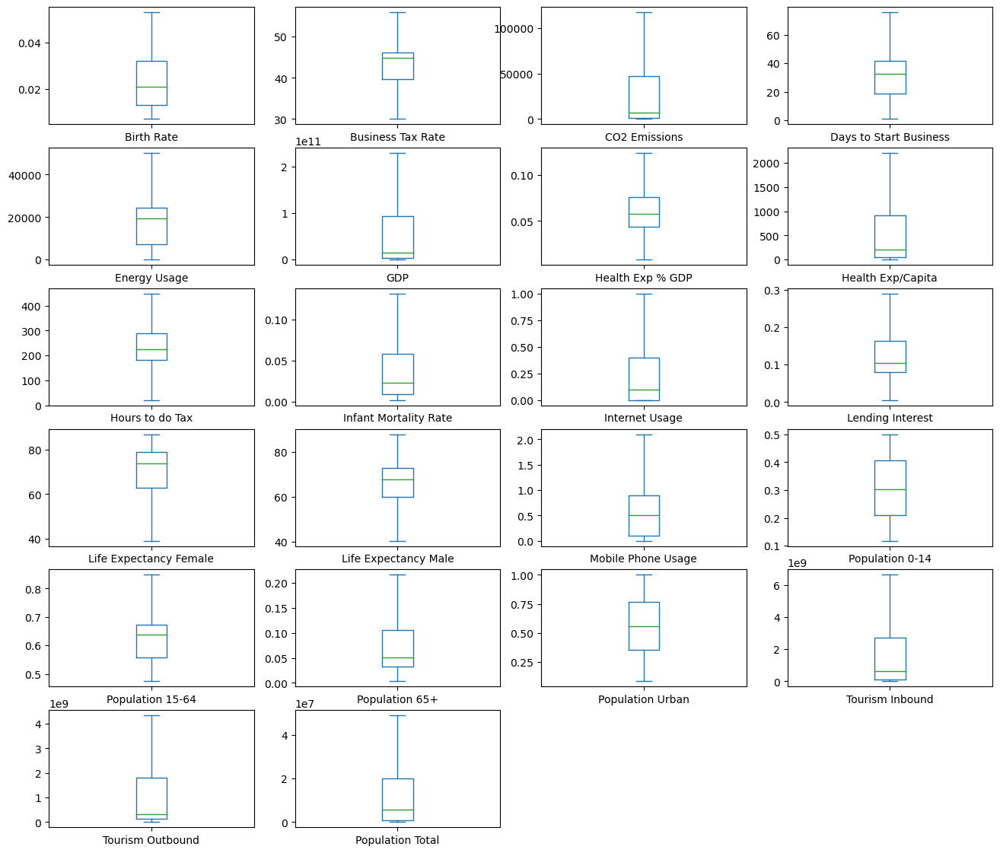

In [34]:
##columns after transformation
plt.figure(figsize=(10,12))
world1.drop(["Country"],axis=1).plot(kind="box",subplots=True,layout=(6,4))
plt.show()

In [35]:
world1.head()

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,...,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Urban,Tourism Inbound,Tourism Outbound,Population Total,Country
0,0.020,44.866667,87931.0,41.666667,26998.000000,5.479006e+10,0.035,60.0,181.000000,0.034,...,67.0,0.0,0.342,0.619,0.039,0.599,102000000.0,193000000.0,31719449.0,Algeria
1,0.050,44.866667,9542.0,41.666667,7499.000000,9.129595e+09,0.034,22.0,181.000000,0.128,...,44.0,0.0,0.476,0.499,0.025,0.324,34000000.0,146000000.0,13924930.0,Angola
2,0.043,44.866667,1617.0,41.666667,1983.000000,2.359122e+09,0.043,15.0,181.000000,0.090,...,53.0,0.0,0.454,0.517,0.029,0.383,77000000.0,50000000.0,6949366.0,Benin
3,0.027,44.866667,4276.0,41.666667,1836.000000,5.788312e+09,0.047,152.0,181.000000,0.054,...,49.0,0.1,0.383,0.587,0.029,0.532,227000000.0,209000000.0,1755375.0,Botswana
4,0.046,44.033333,1041.0,32.666667,19272.333333,2.610959e+09,0.051,12.0,275.666667,0.096,...,49.0,0.0,0.468,0.505,0.028,0.178,23000000.0,30000000.0,11607944.0,Burkina Faso


### Country vise feature information using choropleth graph

In [36]:
import plotly.express as px
for i in world.drop(["Country"],axis=1):
  fig=px.choropleth(
      data_frame=world,
      locationmode="country names",
      locations="Country",
      color_continuous_scale="YlOrBr",
      color=i,
      title=f"{i} rate by countries")
  fig.update_layout(margin={'r':20,"t":80,"l":20,"b":50},
                    title=dict(y=0.9,x=0.5,xanchor="center",yanchor="top"))
  fig.show()







shape of the data :- there are 2704 rows and 25 columns present in the dataset

                  :- null values were present in the data which are removed by median imputation

                  :- required columns were cleaned and converted to proper data types

                  :- outliers were treated by log transformation

                  :- and IQR method
                  



In [37]:
world2=world1.copy()


# Standardization

In [38]:
from sklearn.preprocessing import StandardScaler
scale=StandardScaler()
scaledata=scale.fit_transform(world1.drop("Country",axis=1))
scaledata
scaledf=pd.DataFrame(scaledata)
scaledf


,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,18,19,20,21
0,-0.277559,0.170362,1.387463,0.334092,0.437611,-0.076109,-1.147082,-0.708132,-0.624710,-0.060936,...,0.031549,0.103479,-1.156917,0.322566,-0.017970,-0.679230,0.150201,-0.730801,-0.637901,1.090800
1,2.335470,0.170362,-0.513736,0.334092,-0.803525,-0.616643,-1.190081,-0.756645,-0.624710,2.869726,...,-2.192273,-2.327180,-1.156917,1.592450,-1.754720,-0.969589,-0.970643,-0.759102,-0.667034,0.021270
2,1.725763,0.170362,-0.705944,0.334092,-1.154625,-0.696793,-0.803090,-0.765582,-0.624710,1.684990,...,-1.265681,-1.376053,-1.156917,1.383962,-1.494207,-0.886629,-0.730171,-0.741206,-0.726539,-0.397993
3,0.332148,0.170362,-0.641455,0.334092,-1.163982,-0.656198,-0.631093,-0.590679,-0.624710,0.562609,...,-1.728977,-1.798776,-0.945977,0.711113,-0.481103,-0.886629,-0.122877,-0.678778,-0.627984,-0.710175
4,1.987066,0.062370,-0.719914,-0.119710,-0.054137,-0.693811,-0.459097,-0.769412,0.305433,1.872054,...,-1.728977,-1.798776,-1.156917,1.516636,-1.667882,-0.907369,-1.565710,-0.763680,-0.738936,-0.117991
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,1.261225,1.601788,0.055928,1.191274,-0.506846,-0.463182,-1.046751,-0.743453,0.849109,1.497927,...,-1.142135,-1.199918,-1.156917,1.099659,-1.088966,-0.845149,1.421850,-0.743703,-0.677158,-0.813732
2700,-0.887266,0.369066,-0.730545,-1.514731,1.912618,1.991503,2.679836,2.030201,-0.683662,-0.933900,...,0.958141,1.054607,0.952478,-1.061040,0.676730,1.332546,1.014270,1.986257,1.932355,2.131526
2701,-0.713064,-0.214088,-0.728831,-1.413887,-0.004595,-0.132763,1.174868,0.885142,0.642774,-0.809191,...,0.865482,0.843245,2.007175,-0.833598,0.271488,1.415506,1.572655,0.151509,-0.120333,-0.611611
2702,-0.277559,1.601788,-0.730610,2.048456,-0.008626,1.991503,-0.674092,-0.027671,1.995412,-0.715659,...,0.680164,0.631883,0.952478,-0.189179,0.459636,-0.243691,1.332183,-0.397022,1.227206,0.984736


## PCA (principle components analysis)

In [39]:
from sklearn.decomposition import PCA
pca=PCA(n_components=22)
pca_values=pca.fit_transform(scaledata)
pca_values

array([[-7.90764903e-01,  1.17594822e+00,  9.84401738e-01, ...,
         2.52657034e-01,  1.20923417e-01,  7.74806118e-04],
       [-5.78766248e+00,  1.40558568e+00, -1.01232040e+00, ...,
         2.46530124e-02, -9.52675363e-02,  3.19140058e-04],
       [-4.24505715e+00,  1.73040583e-01, -1.12227548e+00, ...,
         1.22110650e-01, -1.42774244e-01,  8.12213554e-04],
       ...,
       [ 2.82931220e+00, -1.99574296e+00, -4.17060275e-01, ...,
        -6.17972740e-02,  5.35296378e-02,  5.87649130e-03],
       [ 1.43781775e+00,  1.05278164e+00,  2.64962142e+00, ...,
         2.73946903e-01, -7.11853599e-02, -4.18227292e-03],
       [ 4.44658827e-02, -1.15943672e+00,  3.34169463e+00, ...,
         1.38537278e-01,  1.33808942e-01,  6.25932342e-03]])

In [40]:
var=pca.explained_variance_ratio_
var

array([4.44891202e-01, 1.37613039e-01, 7.10222910e-02, 5.74043109e-02,
       4.34922102e-02, 3.99372605e-02, 3.31467326e-02, 2.97086877e-02,
       2.36223610e-02, 2.05558407e-02, 1.79394407e-02, 1.73964833e-02,
       1.32081258e-02, 1.23764380e-02, 9.70977671e-03, 8.50628733e-03,
       7.01773030e-03, 5.54543387e-03, 3.65024580e-03, 2.59547379e-03,
       6.58270996e-04, 2.35792207e-06])

Text(0.5, 1.0, 'Variance_ratio')

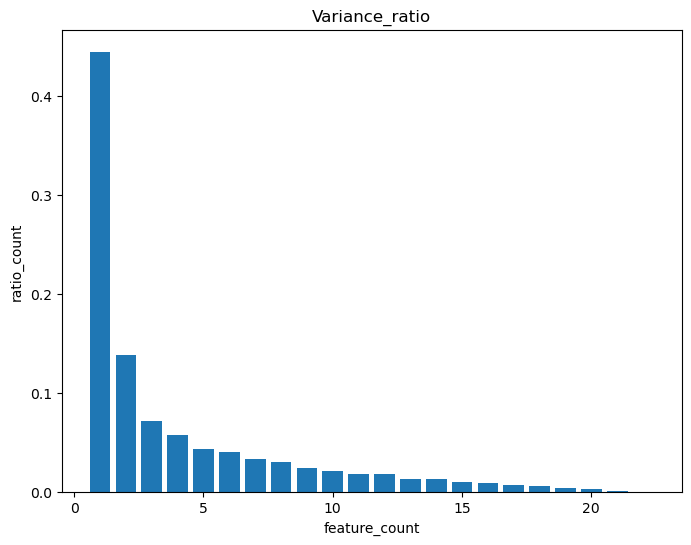

In [41]:
plt.figure(figsize=(8,6))
plt.bar(range(1,len(var)+1),var)
plt.xlabel("feature_count")
plt.ylabel("ratio_count")
plt.title("Variance_ratio")



In [42]:
var1=np.cumsum(np.round(var*100,2))
var1

array([44.49, 58.25, 65.35, 71.09, 75.44, 79.43, 82.74, 85.71, 88.07,
       90.13, 91.92, 93.66, 94.98, 96.22, 97.19, 98.04, 98.74, 99.29,
       99.66, 99.92, 99.99, 99.99])

In [43]:
#considering only first 10 features
pca_df=pd.DataFrame(pca_values[:,0:10])
pca_df=pca_df.set_index(world["Country"])
pca_df.iloc[:,:]


,0,1,2,3,4,5,6,7,8,9
Country,,,,,,,,,,
Algeria,-0.790765,1.175948,0.984402,-1.847399,-0.299565,0.624582,-0.994529,0.189492,-0.386315,-0.547253
Angola,-5.787662,1.405586,-1.012320,0.601155,0.319217,1.109541,0.625447,1.458244,1.426142,0.275082
Benin,-4.245057,0.173041,-1.122275,-0.002598,0.459231,0.799238,-1.109649,-0.521758,0.198451,-0.168110
Botswana,-3.302946,-0.380320,-0.257966,-0.024795,0.009031,0.814406,-0.348198,0.194860,0.902107,-0.797864
Burkina Faso,-4.620096,1.128578,-1.613567,0.233085,0.456622,-0.343876,-0.903270,-0.692631,0.321442,-0.256203
...,...,...,...,...,...,...,...,...,...,...
Turks and Caicos Islands,-3.893075,0.897744,1.882721,1.645454,0.683570,1.403676,0.457613,1.512777,-0.219417,-0.568250
United States,5.832709,1.302781,-2.343986,1.726600,-0.691455,-0.411258,-0.330877,-0.103292,-0.363006,0.719213
Uruguay,2.829312,-1.995743,-0.417060,1.534419,0.547590,-1.252643,0.543192,0.501523,-0.505184,-0.453917


##Finding the optimal number of CLUSTERS

###ELBOW Method

In [44]:
wcss=[]  #within cluster sum of square
for i in range(1,10):
  kmeans=KMeans(n_clusters=i,init="k-means++",random_state=1)
  kmeans.fit(pca_df)
  wcss.append(kmeans.inertia_)

wcss

[53622.12244114607,
 35092.57543817862,
 27654.602195323736,
 24280.03778294209,
 21927.7285821241,
 20886.709933431524,
 19940.364796605758,
 19196.73301539613,
 18505.505013465656]

Text(0, 0.5, 'inertia')

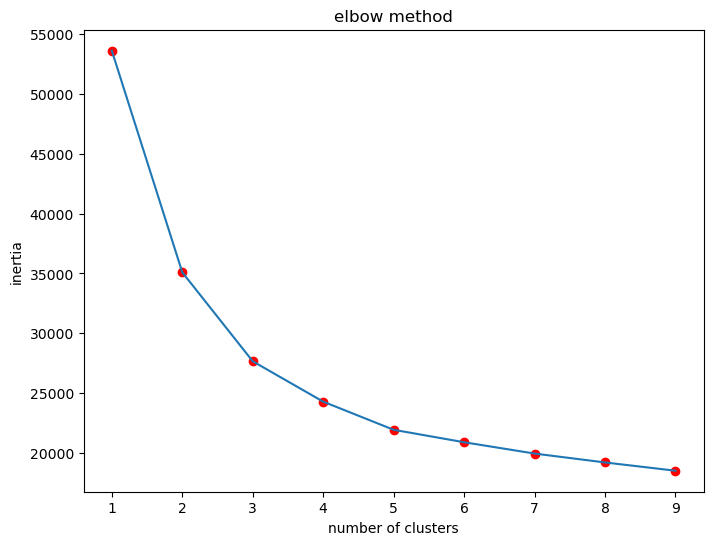

In [45]:
plt.figure(figsize=(8,6))
plt.plot(range(1,10),wcss)
plt.scatter(range(1,10),wcss,color="red")
plt.title("elbow method")
plt.xlabel("number of clusters")
plt.ylabel("inertia")


In [46]:
from sklearn.metrics import silhouette_score as sil
nc=range(2,11)
score=[]
for i in nc:
  km=KMeans(i)
  y=km.fit_predict(pca_df)
  score.append(sil(pca_df,y))

score

[0.2921192384147814,
 0.25997141072493296,
 0.2707899169218151,
 0.21251225797997797,
 0.1803383500595499,
 0.17477528340660275,
 0.16824726865410605,
 0.16956800241217404,
 0.1592483139190917]

Text(0, 0.5, 'inertia')

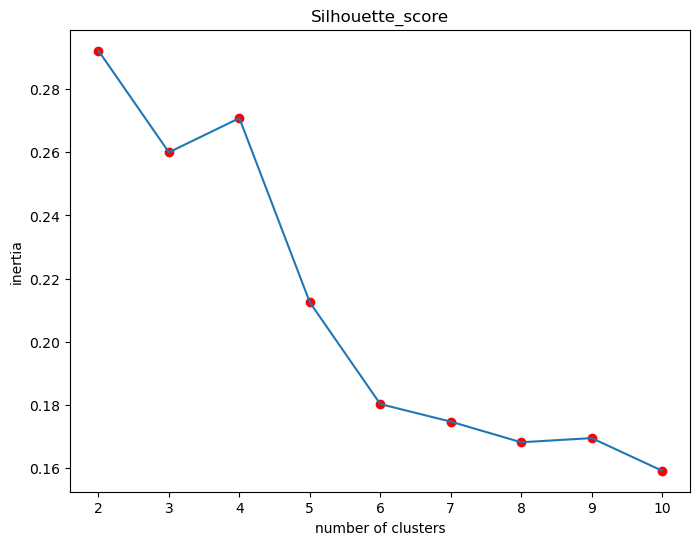

In [47]:
plt.figure(figsize=(8,6))
plt.plot(range(2,11),score)
plt.scatter(range(2,11),score,color="red")
plt.title("Silhouette_score")
plt.xlabel("number of clusters")
plt.ylabel("inertia")

## MODEL BUILDING  ( K- MEANS)

In [48]:
km=KMeans(n_clusters=3,random_state=31,max_iter=100,n_init=1,verbose=0)
kmeans=km.fit_predict(pca_df)
kmeans=kmeans+1
kmeans

array([1, 2, 2, ..., 1, 1, 1])

In [49]:
km.inertia_

27654.724789616677

In [50]:
world2["kmeans"]=kmeans
world2

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,...,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Urban,Tourism Inbound,Tourism Outbound,Population Total,Country,kmeans
0,0.020000,44.866667,87931.000000,41.666667,26998.000000,5.479006e+10,0.035000,60.000000,181.000000,0.034,...,0.0,0.342,0.619,0.039,0.599,1.020000e+08,1.930000e+08,3.171945e+07,Algeria,1
1,0.050000,44.866667,9542.000000,41.666667,7499.000000,9.129595e+09,0.034000,22.000000,181.000000,0.128,...,0.0,0.476,0.499,0.025,0.324,3.400000e+07,1.460000e+08,1.392493e+07,Angola,2
2,0.043000,44.866667,1617.000000,41.666667,1983.000000,2.359122e+09,0.043000,15.000000,181.000000,0.090,...,0.0,0.454,0.517,0.029,0.383,7.700000e+07,5.000000e+07,6.949366e+06,Benin,2
3,0.027000,44.866667,4276.000000,41.666667,1836.000000,5.788312e+09,0.047000,152.000000,181.000000,0.054,...,0.1,0.383,0.587,0.029,0.532,2.270000e+08,2.090000e+08,1.755375e+06,Botswana,2
4,0.046000,44.033333,1041.000000,32.666667,19272.333333,2.610959e+09,0.051000,12.000000,275.666667,0.096,...,0.0,0.468,0.505,0.028,0.178,2.300000e+07,3.000000e+07,1.160794e+07,Burkina Faso,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.037667,55.912500,33030.000000,58.666667,12160.000000,2.209293e+10,0.037333,32.333333,331.000000,0.084,...,0.0,0.424,0.545,0.031,0.911,7.100000e+07,1.296667e+08,3.242700e+04,Turks and Caicos Islands,2
2700,0.013000,46.400000,602.666667,5.000000,50171.250000,2.294472e+11,0.124000,2204.916667,175.000000,0.006,...,1.0,0.196,0.667,0.136,0.811,6.630500e+09,4.339625e+09,4.903473e+07,United States,3
2701,0.015000,41.900000,673.333333,7.000000,20050.666667,5.000435e+10,0.089000,1308.000000,310.000000,0.010,...,1.5,0.220,0.639,0.140,0.948,2.222000e+09,1.028000e+09,3.395253e+06,Uruguay,1
2702,0.020000,55.912500,600.000000,75.666667,19987.333333,2.294472e+11,0.046000,593.000000,447.666667,0.013,...,1.0,0.288,0.652,0.060,0.889,9.040000e+08,3.202000e+09,2.995478e+07,"Venezuela, RB",1


In [51]:
world2.groupby(["kmeans"]).Country.apply(lambda x:list(x))

kmeans
1    [Algeria, Libya, Mauritius, Seychelles, Tunisi...
2    [Angola, Benin, Botswana, Burkina Faso, Burund...
3    [South Africa, China, Hong Kong SAR, China, In...
Name: Country, dtype: object

In [52]:
world2.groupby("kmeans").mean().T

kmeans,1,2,3
Birth Rate,1.710552e-02,3.535854e-02,1.396865e-02
Business Tax Rate,4.240681e+01,4.460333e+01,4.387415e+01
CO2 Emissions,2.097690e+04,1.156411e+04,8.007937e+04
Days to Start Business,3.319884e+01,4.188624e+01,2.701045e+01
Energy Usage,1.380528e+04,1.442360e+04,4.096917e+04
GDP,2.594098e+10,1.394600e+10,2.032467e+11
Health Exp % GDP,5.947880e-02,5.642952e-02,7.434378e-02
Health Exp/Capita,6.552569e+02,1.426643e+02,1.324269e+03
Hours to do Tax,2.360625e+02,2.676511e+02,2.216843e+02
Infant Mortality Rate,2.146661e-02,6.560000e-02,1.292079e-02


In [53]:
world2[world2["kmeans"]==1]["Country"].unique()

array(['Algeria', 'Libya', 'Mauritius', 'Seychelles', 'Tunisia',
       'Armenia', 'Azerbaijan', 'Brunei Darussalam', 'Georgia',
       'Kazakhstan', 'Korea, Dem. Rep.', 'Macao SAR, China', 'Sri Lanka',
       'Vietnam', 'Albania', 'Andorra', 'Belarus',
       'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Cyprus',
       'Czech Republic', 'Estonia', 'Faeroe Islands', 'Hungary',
       'Iceland', 'Ireland', 'Kosovo', 'Latvia', 'Liechtenstein',
       'Lithuania', 'Luxembourg', 'Macedonia, FYR', 'Malta', 'Moldova',
       'Monaco', 'Montenegro', 'Romania', 'San Marino', 'Serbia',
       'Slovak Republic', 'Slovenia', 'Ukraine', 'Bahrain',
       'Iran, Islamic Rep.', 'Jordan', 'Kuwait', 'Lebanon', 'Oman',
       'Qatar', 'Saudi Arabia', 'United Arab Emirates', 'Fiji',
       'French Polynesia', 'Guam', 'Marshall Islands', 'New Caledonia',
       'New Zealand', 'Antigua and Barbuda', 'Aruba', 'Bahamas, The',
       'Barbados', 'Bermuda', 'Cayman Islands', 'Chile', 'Colombia',
       '

## HIERARCHICAL CLUSTERING

In [54]:
sedf=pd.DataFrame({"linkage":[],"cluster_number":[],"sc_score":[]})
max_score=0
nc=range(2,11)
h=["ward","single","complete","average"]

for i in nc:
  for linkage in h:
    sc=AgglomerativeClustering(n_clusters=i,linkage=linkage)
    y=sc.fit_predict(pca_df)
    score=sil(pca_df,y)
    sedf.loc[len(sedf.index)]=[linkage,i,score]

In [55]:
sedf.sort_values(by="sc_score",ascending=False)

,linkage,cluster_number,sc_score
3,average,2,0.300732
2,complete,2,0.265401
8,ward,4,0.244091
0,ward,2,0.236673
11,average,4,0.235706
6,complete,3,0.226031
10,complete,4,0.225666
15,average,5,0.225129
4,ward,3,0.225004
14,complete,5,0.224372


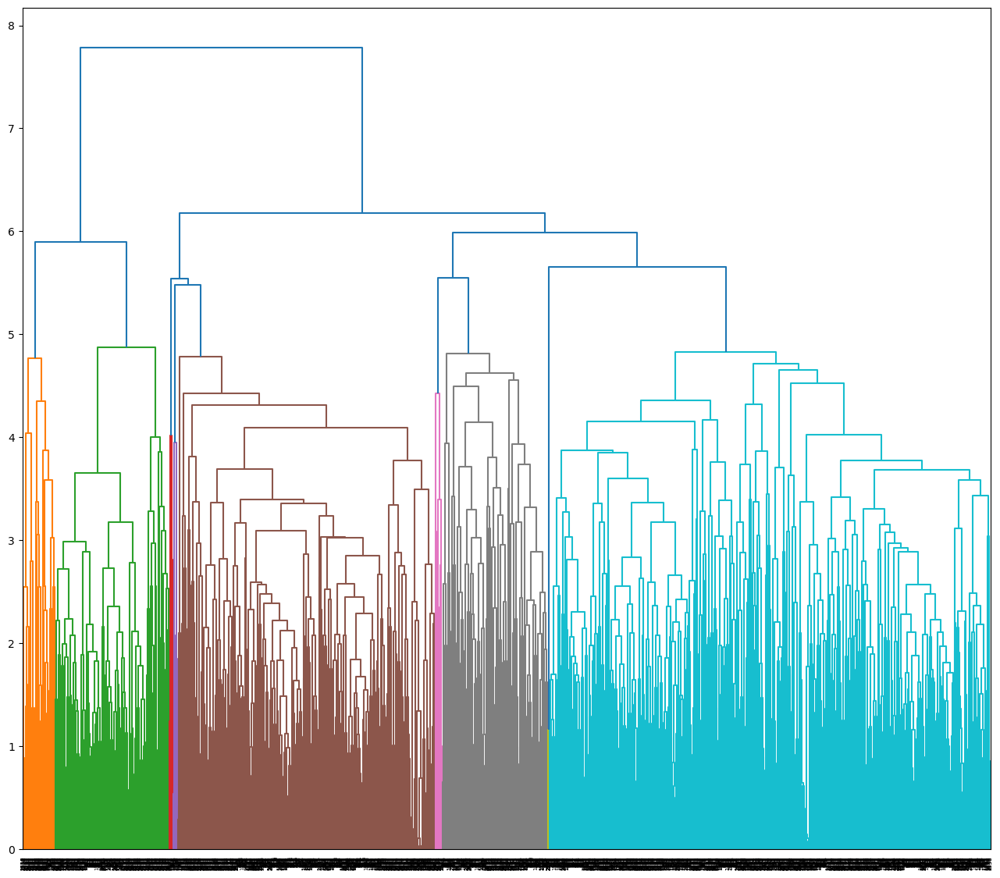

In [56]:
from seaborn.matrix import dendrogram
dendrogram=sch.dendrogram(sch.linkage(pca_df,method="average"))

In [57]:
model=AgglomerativeClustering(n_clusters=3,affinity="euclidean",linkage="average")
hc=model.fit(pca_df)

In [58]:
y=hc.fit_predict(pca_df)

In [59]:
h_clusters=model.labels_+1

In [60]:
world2["h_clusters"]=h_clusters
world2

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,...,Population 0-14,Population 15-64,Population 65+,Population Urban,Tourism Inbound,Tourism Outbound,Population Total,Country,kmeans,h_clusters
0,0.020000,44.866667,87931.000000,41.666667,26998.000000,5.479006e+10,0.035000,60.000000,181.000000,0.034,...,0.342,0.619,0.039,0.599,1.020000e+08,1.930000e+08,3.171945e+07,Algeria,1,1
1,0.050000,44.866667,9542.000000,41.666667,7499.000000,9.129595e+09,0.034000,22.000000,181.000000,0.128,...,0.476,0.499,0.025,0.324,3.400000e+07,1.460000e+08,1.392493e+07,Angola,2,3
2,0.043000,44.866667,1617.000000,41.666667,1983.000000,2.359122e+09,0.043000,15.000000,181.000000,0.090,...,0.454,0.517,0.029,0.383,7.700000e+07,5.000000e+07,6.949366e+06,Benin,2,3
3,0.027000,44.866667,4276.000000,41.666667,1836.000000,5.788312e+09,0.047000,152.000000,181.000000,0.054,...,0.383,0.587,0.029,0.532,2.270000e+08,2.090000e+08,1.755375e+06,Botswana,2,3
4,0.046000,44.033333,1041.000000,32.666667,19272.333333,2.610959e+09,0.051000,12.000000,275.666667,0.096,...,0.468,0.505,0.028,0.178,2.300000e+07,3.000000e+07,1.160794e+07,Burkina Faso,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.037667,55.912500,33030.000000,58.666667,12160.000000,2.209293e+10,0.037333,32.333333,331.000000,0.084,...,0.424,0.545,0.031,0.911,7.100000e+07,1.296667e+08,3.242700e+04,Turks and Caicos Islands,2,3
2700,0.013000,46.400000,602.666667,5.000000,50171.250000,2.294472e+11,0.124000,2204.916667,175.000000,0.006,...,0.196,0.667,0.136,0.811,6.630500e+09,4.339625e+09,4.903473e+07,United States,3,2
2701,0.015000,41.900000,673.333333,7.000000,20050.666667,5.000435e+10,0.089000,1308.000000,310.000000,0.010,...,0.220,0.639,0.140,0.948,2.222000e+09,1.028000e+09,3.395253e+06,Uruguay,1,1
2702,0.020000,55.912500,600.000000,75.666667,19987.333333,2.294472e+11,0.046000,593.000000,447.666667,0.013,...,0.288,0.652,0.060,0.889,9.040000e+08,3.202000e+09,2.995478e+07,"Venezuela, RB",1,1


In [61]:
world2.groupby(["h_clusters"]).Country.apply(lambda x:list(x))

h_clusters
1    [Algeria, Egypt, Arab Rep., Libya, Mauritius, ...
2    [Japan, Singapore, Austria, Belgium, Denmark, ...
3    [Angola, Benin, Botswana, Burkina Faso, Burund...
Name: Country, dtype: object

In [62]:
world2.groupby("h_clusters").mean()

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,...,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Urban,Tourism Inbound,Tourism Outbound,Population Total,kmeans
h_clusters,,,,,,,,,,,,,,,,,,,,,
1,0.018873,43.252328,31183.359167,34.926022,18421.860753,4.768227e+10,0.059146,546.455323,245.387312,0.025548,...,69.122151,0.580258,0.281215,0.643427,0.075371,0.592735,1.595859e+09,9.616964e+08,1.158270e+07,1.468387
2,0.012657,42.285138,71691.178528,20.669100,38473.612530,2.022983e+11,0.079626,1737.253244,195.221411,0.007349,...,76.182482,1.051338,0.185771,0.683925,0.129991,0.803285,5.693660e+09,4.018819e+09,2.306830e+07,2.824818
3,0.038010,44.878090,7104.307761,43.230148,13520.423508,1.141932e+10,0.057028,136.020974,270.201884,0.073489,...,53.930013,0.203948,0.431353,0.536646,0.031979,0.364951,2.829599e+08,2.184205e+08,1.246549e+07,1.997308


## GAUSSIAN MIXTURE MODEL

In [63]:
from sklearn.mixture import GaussianMixture

In [64]:
N = np.arange(1, 5)

def compute_GaussianMixture(N, covariance_type='full', max_iter=1000):
    models = [None for n in N]
    for i in range(len(N)):
        models[i] = GaussianMixture(n_components=N[i], max_iter=max_iter,
                                    covariance_type=covariance_type)
        models[i].fit(pca_df)
    return models

models = compute_GaussianMixture(N)

AIC = [m.aic(pca_df) for m in models]
BIC = [m.bic(pca_df) for m in models]

i_best = np.argmin(BIC)
gmm_best = models[i_best]
print("best fit converged:", gmm_best.converged_)
print("BIC: n_components =  %i" % N[i_best])

best fit converged: True
BIC: n_components =  4


In [65]:
gm=GaussianMixture(n_components=4)
gmm=gm.fit_predict(pca_df)

In [66]:
labels=gm.predict(pca_df)
labels=labels+1

In [67]:
world2["gm_clusters"]=labels
world2

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,...,Population 15-64,Population 65+,Population Urban,Tourism Inbound,Tourism Outbound,Population Total,Country,kmeans,h_clusters,gm_clusters
0,0.020000,44.866667,87931.000000,41.666667,26998.000000,5.479006e+10,0.035000,60.000000,181.000000,0.034,...,0.619,0.039,0.599,1.020000e+08,1.930000e+08,3.171945e+07,Algeria,1,1,4
1,0.050000,44.866667,9542.000000,41.666667,7499.000000,9.129595e+09,0.034000,22.000000,181.000000,0.128,...,0.499,0.025,0.324,3.400000e+07,1.460000e+08,1.392493e+07,Angola,2,3,2
2,0.043000,44.866667,1617.000000,41.666667,1983.000000,2.359122e+09,0.043000,15.000000,181.000000,0.090,...,0.517,0.029,0.383,7.700000e+07,5.000000e+07,6.949366e+06,Benin,2,3,2
3,0.027000,44.866667,4276.000000,41.666667,1836.000000,5.788312e+09,0.047000,152.000000,181.000000,0.054,...,0.587,0.029,0.532,2.270000e+08,2.090000e+08,1.755375e+06,Botswana,2,3,2
4,0.046000,44.033333,1041.000000,32.666667,19272.333333,2.610959e+09,0.051000,12.000000,275.666667,0.096,...,0.505,0.028,0.178,2.300000e+07,3.000000e+07,1.160794e+07,Burkina Faso,2,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.037667,55.912500,33030.000000,58.666667,12160.000000,2.209293e+10,0.037333,32.333333,331.000000,0.084,...,0.545,0.031,0.911,7.100000e+07,1.296667e+08,3.242700e+04,Turks and Caicos Islands,2,3,2
2700,0.013000,46.400000,602.666667,5.000000,50171.250000,2.294472e+11,0.124000,2204.916667,175.000000,0.006,...,0.667,0.136,0.811,6.630500e+09,4.339625e+09,4.903473e+07,United States,3,2,1
2701,0.015000,41.900000,673.333333,7.000000,20050.666667,5.000435e+10,0.089000,1308.000000,310.000000,0.010,...,0.639,0.140,0.948,2.222000e+09,1.028000e+09,3.395253e+06,Uruguay,1,1,3
2702,0.020000,55.912500,600.000000,75.666667,19987.333333,2.294472e+11,0.046000,593.000000,447.666667,0.013,...,0.652,0.060,0.889,9.040000e+08,3.202000e+09,2.995478e+07,"Venezuela, RB",1,1,4


In [68]:
world2.groupby("gm_clusters").mean()

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,...,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Urban,Tourism Inbound,Tourism Outbound,Population Total,kmeans,h_clusters
gm_clusters,,,,,,,,,,,,,,,,,,,,,
1,0.013462,42.058971,45399.144361,25.836824,25791.959751,1.197511e+11,0.070449,1384.667103,183.383944,0.009182,...,0.914136,0.205503,0.680401,0.113966,0.721546,3.813989e+09,2.517150e+09,1.258779e+07,2.041885,1.467277
2,0.035501,44.252166,6151.672026,42.541979,12535.001072,7.951871e+09,0.059053,128.570829,256.123258,0.063727,...,0.193748,0.418808,0.546738,0.034430,0.378997,2.660406e+08,1.584172e+08,9.334990e+06,1.914255,2.515541
3,0.017992,43.401601,14744.973205,34.157556,11607.808682,1.584655e+10,0.060702,630.968650,275.977492,0.031169,...,0.658789,0.275143,0.643959,0.080890,0.636151,8.991611e+08,4.624988e+08,4.873067e+06,1.127010,1.053055
4,0.021034,45.061299,86966.109416,36.554113,41018.034632,1.474578e+11,0.052203,238.378355,287.324675,0.029512,...,0.504156,0.295685,0.640669,0.063649,0.570122,3.383203e+09,2.457326e+09,3.984011e+07,2.270130,1.241558


In [69]:
world2.groupby(["gm_clusters"]).Country.apply(lambda x:list(x))

gm_clusters
1    [Libya, Tunisia, Brunei Darussalam, Hong Kong ...
2    [Angola, Benin, Botswana, Burkina Faso, Burund...
3    [Mauritius, Seychelles, Armenia, Azerbaijan, G...
4    [Algeria, Egypt, Arab Rep., Morocco, Nigeria, ...
Name: Country, dtype: object

### DBSCAN

In [70]:
dbscan = DBSCAN(eps=0.5, min_samples=12).fit(pca_df)
db=dbscan.fit_predict(pca_df)
dblabels=dbscan.labels_+1
dblabels

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [71]:
world2['DBScan']=dblabels+1
world2.head(10)

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,...,Population 65+,Population Urban,Tourism Inbound,Tourism Outbound,Population Total,Country,kmeans,h_clusters,gm_clusters,DBScan
0,0.020,44.866667,87931.0,41.666667,26998.000000,5.479006e+10,0.035,60.0,181.000000,0.034,...,0.039,0.599,102000000.0,1.930000e+08,31719449.0,Algeria,1,1,4,1
1,0.050,44.866667,9542.0,41.666667,7499.000000,9.129595e+09,0.034,22.0,181.000000,0.128,...,0.025,0.324,34000000.0,1.460000e+08,13924930.0,Angola,2,3,2,1
2,0.043,44.866667,1617.0,41.666667,1983.000000,2.359122e+09,0.043,15.0,181.000000,0.090,...,0.029,0.383,77000000.0,5.000000e+07,6949366.0,Benin,2,3,2,1
3,0.027,44.866667,4276.0,41.666667,1836.000000,5.788312e+09,0.047,152.0,181.000000,0.054,...,0.029,0.532,227000000.0,2.090000e+08,1755375.0,Botswana,2,3,2,1
4,0.046,44.033333,1041.0,32.666667,19272.333333,2.610959e+09,0.051,12.0,275.666667,0.096,...,0.028,0.178,23000000.0,3.000000e+07,11607944.0,Burkina Faso,2,3,2,1
5,0.042,44.033333,301.0,32.666667,19272.333333,8.704861e+08,0.063,7.0,275.666667,0.092,...,0.029,0.082,1400000.0,1.400000e+07,6674286.0,Burundi,2,3,2,1
6,0.041,44.866667,3432.0,41.666667,6310.000000,9.287368e+09,0.044,26.0,181.000000,0.093,...,0.034,0.455,132000000.0,2.410000e+08,15927713.0,Cameroon,2,3,2,1
7,0.039,44.033333,268.0,32.666667,19272.333333,9.145003e+08,0.043,11.0,275.666667,0.113,...,0.040,0.376,5000000.0,3.300000e+07,3638316.0,Central African Republic,2,3,2,1
8,0.051,44.033333,176.0,32.666667,19272.333333,1.385058e+09,0.063,10.0,275.666667,0.106,...,0.028,0.216,14000000.0,5.600000e+07,8301151.0,Chad,2,3,2,1
9,0.039,44.033333,84.0,32.666667,19107.666667,2.018999e+08,0.035,13.0,275.666667,0.073,...,0.031,0.281,15000000.0,1.493333e+07,528312.0,Comoros,2,3,2,1


In [72]:
world2.groupby("DBScan").mean()

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,...,Population 0-14,Population 15-64,Population 65+,Population Urban,Tourism Inbound,Tourism Outbound,Population Total,kmeans,h_clusters,gm_clusters
DBScan,,,,,,,,,,,,,,,,,,,,,
1,0.023146,43.467049,30698.706777,34.811426,20193.167756,6.158785e+10,0.061912,620.310711,243.952079,0.035483,...,0.306837,0.620979,0.072137,0.561081,1.875217e+09,1.232431e+09,1.370240e+07,1.818148,1.698656,2.234503
2,0.037667,55.912500,33030.000000,58.666667,12160.000000,2.209293e+10,0.037333,32.333333,331.000000,0.084000,...,0.424000,0.545000,0.031000,0.884769,7.100000e+07,1.296667e+08,5.366885e+04,2.000000,3.000000,2.000000
3,0.017077,48.700000,33635.000000,58.666667,13602.333333,2.440234e+10,0.037667,36.000000,287.666667,0.085000,...,0.423667,0.543667,0.032667,0.459333,8.933333e+07,1.933333e+08,2.882485e+04,2.000000,1.000000,2.000000


In [73]:
world2.groupby(["DBScan"]).Country.apply(lambda x:list(x))

DBScan
1    [Algeria, Angola, Benin, Botswana, Burkina Fas...
2    [American Samoa, American Samoa, American Samo...
3    [St. Martin (French part), St. Martin (French ...
Name: Country, dtype: object

In [74]:
world2.iloc[:,-5:]

,Country,kmeans,h_clusters,gm_clusters,DBScan
0,Algeria,1,1,4,1
1,Angola,2,3,2,1
2,Benin,2,3,2,1
3,Botswana,2,3,2,1
4,Burkina Faso,2,3,2,1
...,...,...,...,...,...
2699,Turks and Caicos Islands,2,3,2,2
2700,United States,3,2,1,1
2701,Uruguay,1,1,3,1
2702,"Venezuela, RB",1,1,4,1


In [75]:
world2[world2["Country"]=="Algeria"][["kmeans","h_clusters","gm_clusters","DBScan"]]

,kmeans,h_clusters,gm_clusters,DBScan
0,1,1,4,1
208,1,1,4,1
416,1,1,4,1
624,1,1,4,1
832,1,1,4,1
1040,1,1,4,1
1248,1,1,4,1
1456,1,1,4,1
1664,1,1,4,1
1872,1,1,4,1


Text(0.5, 1.0, 'k-means clustering')

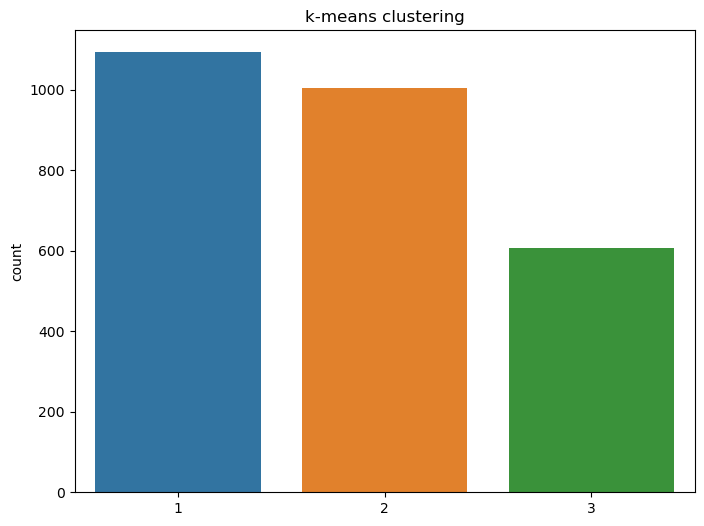

In [76]:
plt.figure(figsize=(8,6))
sns.countplot(data=world2,x=kmeans)
plt.title("k-means clustering")


Text(0.5, 1.0, 'hierarchical-clustering')

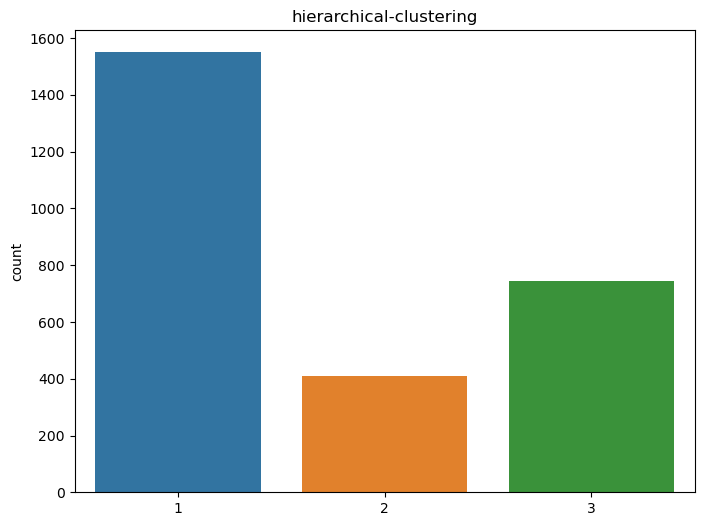

In [88]:
plt.figure(figsize=(8,6))
sns.countplot(data=world2,x=h_clusters)
plt.title("hierarchical-clustering")


Text(0.5, 1.0, 'GMM_clustering')

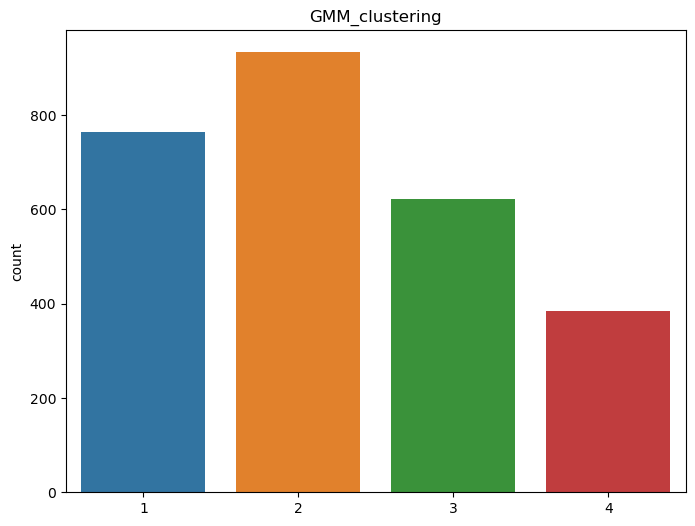

In [90]:
plt.figure(figsize=(8,6))
sns.countplot(data=world2,x=labels)
plt.title("GMM_clustering")

Text(0.5, 1.0, 'DBScan')

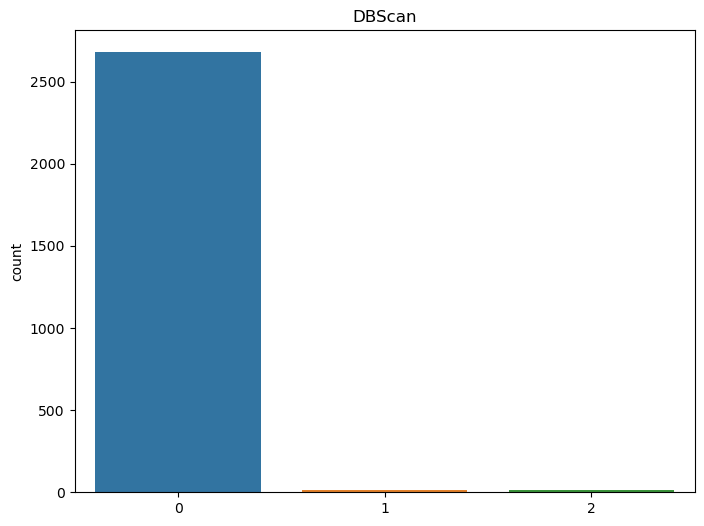

In [79]:
plt.figure(figsize=(8,6))
sns.countplot(data=world2,x=dblabels)
plt.title("DBScan")

### EVALUATING THE MODELS USING SILHOUETTE SCORE & DAVIES-BOULDIN INDEX

In [80]:
print("sil_score of kmeans clustering:",sil(pca_df,kmeans))
print("sil_score of hierarchical clustering:",sil(pca_df,y))
print("sil_score of guassian mixture model clustering:",sil(pca_df,gmm))
print("sil_score of DBScan clustering:",sil(pca_df,db))

sil_score of kmeans clustering: 0.2599483440818623
sil_score of hierarchical clustering: 0.21411632222335203
sil_score of guassian mixture model clustering: 0.16815263612595902
sil_score of DBScan clustering: -0.06756608928092096


In [87]:
from sklearn.metrics import davies_bouldin_score

print("dbi_score of kmeans clustering:",davies_bouldin_score(pca_df,kmeans))
print("dbi_score of hierarchical clustering:",davies_bouldin_score(pca_df,y))
print("dbi_score of guassian mixture model clustering:",davies_bouldin_score(pca_df,gmm))

dbi_score of kmeans clustering: 1.3656900334024125
dbi_score of hierarchical clustering: 1.36847697537916
dbi_score of guassian mixture model clustering: 1.7355323249858818


#####  since k means clustering is giving us the higher silouette score and lowest dbi score we are considering it for further analysis


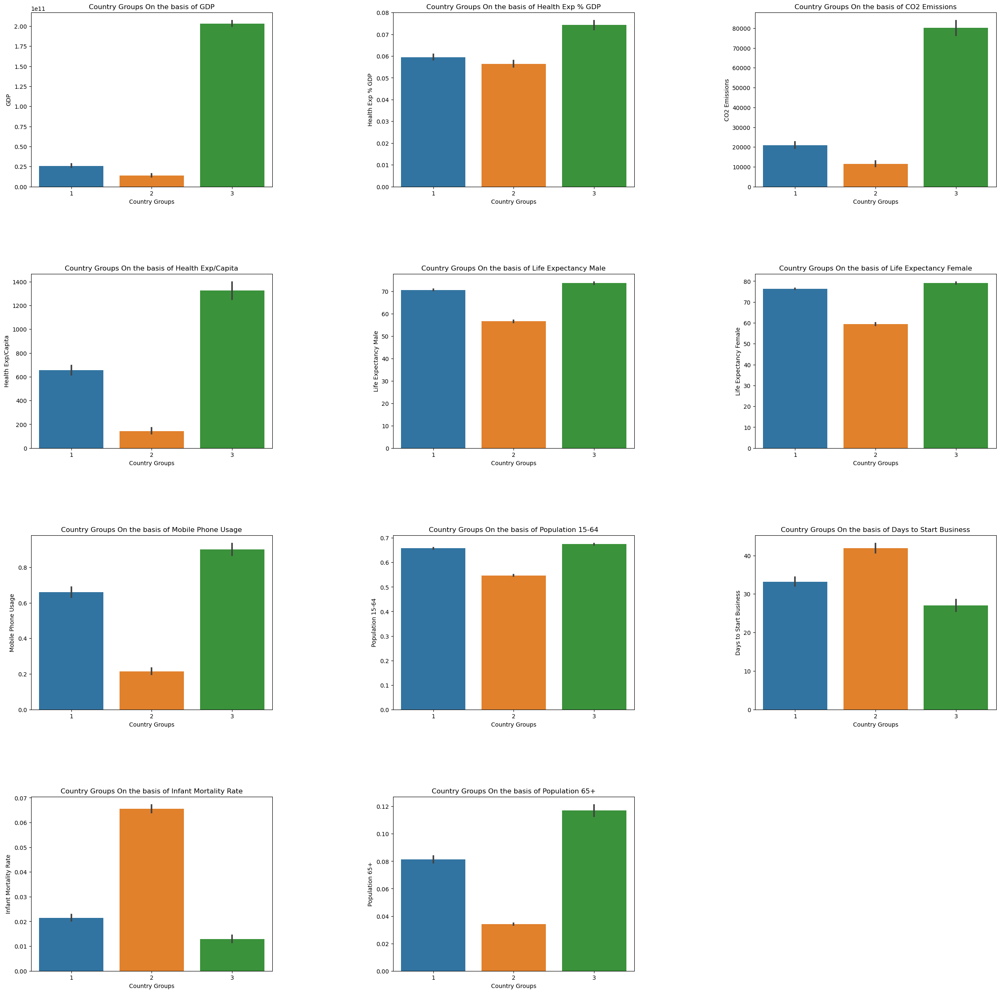

In [82]:
columns = ['GDP','Health Exp % GDP','CO2 Emissions','Health Exp/Capita', 'Life Expectancy Male', 'Life Expectancy Female','Mobile Phone Usage','Population 15-64','Days to Start Business', 'Infant Mortality Rate','Population 65+']
plt.figure(1 , figsize = (30 , 30))
n = 0
for x in columns:
    n += 1
    plt.subplot(4 , 3 , n)
    plt.subplots_adjust(hspace =0.5 , wspace = 0.5)
    s=sns.barplot(x='kmeans',y=x,data=world2)
    plt.xlabel('Country Groups', fontsize=10)
    plt.ylabel(x, fontsize=10)
    plt.title('Country Groups On the basis of {}'.format(x))
plt.show()

## From the graph we can visualize that
cluster-1 ---> UNDER DEVLOPED

cluster-2 ---> DEVLOPING

cluster-3 ---> DEVLOPED

### Saving And Loading The Model

In [83]:
from pickle import dump,load

In [84]:
dump(km,open("world.sav","wb"))

In [85]:
loaded=load(open("world.sav","rb"))
loaded.fit_predict(pca_df)

array([0, 1, 1, ..., 0, 0, 0])

In [86]:
world2.tail().T

,2699,2700,2701,2702,2703
Birth Rate,0.037667,0.013,0.015,0.02,0.011
Business Tax Rate,55.9125,46.4,41.9,55.9125,48.7
CO2 Emissions,33030.0,602.666667,673.333333,600.0,33635.0
Days to Start Business,58.666667,5.0,7.0,75.666667,58.666667
Energy Usage,12160.0,50171.25,20050.666667,19987.333333,13602.333333
GDP,22092925359.666668,229447169705.375,50004354667.0,229447169705.375,24402340448.333332
Health Exp % GDP,0.037333,0.124,0.089,0.046,0.037667
Health Exp/Capita,32.333333,2204.916667,1308.0,593.0,36.0
Hours to do Tax,331.0,175.0,310.0,447.666667,287.666667
Infant Mortality Rate,0.084,0.006,0.01,0.013,0.085
